GAN Project

4/21/2024

In this assignment, a data set of pictures are given 'Monet-like' characteristics using generative models. The cyclic generative adversarial network model was chosen due to its ability to train one generative model using a set of normal pictures and train another generative model using the set of normal pictures and a set of pictures with characteristics of interesting (in this case Monet's paintings). The two models then work together through a shared latent space to take new unseen pictures and distort them with the intended characteristics. Its challenging to determine 'correctness' in a case where the result is rather subjective.  As a result, conclusions regarding the effectiveness of the GAN model are drawn from visual inspection.

The first part of the report is an exploratory data analysis. First, the data is output and a few important notes are taken such as the number of images, their format, and tf record files. Then the images are inspected both Monet's paintings and normal pictures.  RGB characteristics of each type of images are inspected using histograms. Finally the TF records are inspected to determine what they contain. 

After the exploratory data analysis, several cyclic GAN models using hyperparameter tuning and data augmentation.  Each models' outputs are evaluated visually with normal images set side by side with images that they have transformed into 'Monet-like' images.  I apologize in advance for the lack of parameterization and function/class making.  I was both experimenting with each of the four models and too concerned about my familiarity with CycleGAN to make things more elegant.  Finally, the results are discussed below and a submission is generated for Kaggle.

Data Source: https://www.kaggle.com/competitions/gan-getting-started/data

Part 1: Exploratory Data Analysis

Part 2: Cyclic GAN Training

Part 3: Conclusions

https://www.analyticsvidhya.com/blog/2021/06/lstm-for-text-classification/

# __Part 1: Exploratory Data Analysis__

First we will load important libraries up front. The number of images is output along with TF records.  Several images that are both monet's paintings and normal images are examined.  Then their RGB characteristics are examined and placed side by side with the images.  Finally, TF records are more thoroughly explored to determine their contents.  Later, through data augmentation we will flip, rotate, and distort the pictures to enable a wider degree of variance across the data set.

__Discussion__

Libraries imported.

In [32]:
# Import libraries.
import os, cv2, re,  warnings, functools, PIL, random
import numpy as np 
import pandas as pd
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow import keras
from tensorflow.keras import layers
AUTO = tf.data.experimental.AUTOTUNE

__Discussion__

After outputting the training data, we found that there were 300 Monet images and 7038 real images in the data set.  Further, there were 5 Monet tfrecords and 20 real tf record files.

In [33]:
# Explore Amount of data.
print('Monet images: ', len(os.listdir(os.path.join("monet_jpg"))))
print('Real photo: ', len(os.listdir(os.path.join("photo_jpg"))))

monet_tfrec = tf.io.gfile.glob('monet_tfrec/*.tfrec')
real_tfrec = tf.io.gfile.glob('photo_tfrec/*.tfrec')

print("Monet tfrecord files: " + str(len(monet_tfrec)))
print("Real photo tfrecord files: " + str(len(real_tfrec)))

Monet images:  300
Real photo:  7038
Monet tfrecord files: 5
Real photo tfrecord files: 20


__Discussion__

We find after outputting some sample images that the real photos are basically random images of the real world and Monet images are Monet's paintings.  We will also determine the size of the images here.

Real Image Sizes:  (256, 256, 3)
Monet Image Sizes:  (256, 256, 3)


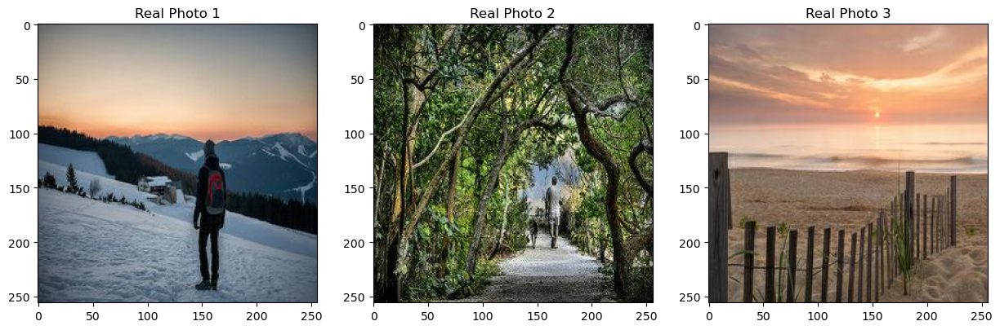

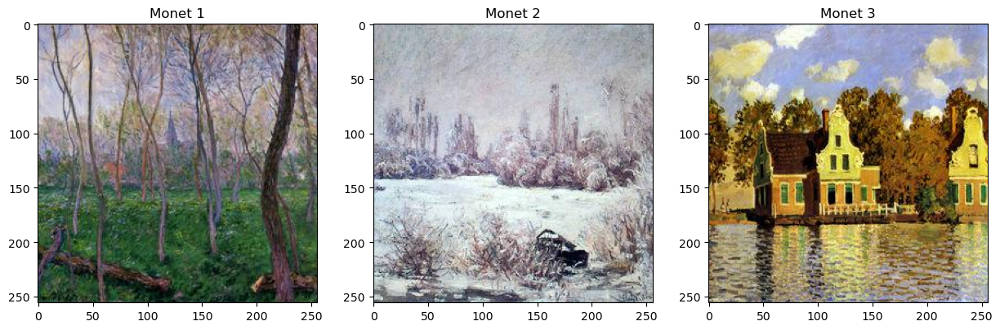

In [34]:
# Sample monet and real images.  Output image sizes.

# Get some pictures.
num_pics = 3
monet_pics = np.random.choice(os.listdir("monet_jpg"), num_pics)
real_pics = np.random.choice(os.listdir("photo_jpg"), num_pics)


# Plot some real pictures.  
fig, ax = plt.subplots(1, num_pics, figsize=(15, 5))
for ind, val in enumerate(real_pics):
    im = cv2.imread(os.path.join("photo_jpg", val))
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB) # Color coding was backwards.
    ax[ind].imshow(im)
    ax[ind].set_title(("Real Photo " + str(ind + 1)))

print("Real Image Sizes: ", im.shape)


# Plot some of Monet's pictures.
fig, ax = plt.subplots(1, num_pics, figsize=(15, 5))
for ind, val in enumerate(monet_pics):
    im = cv2.imread(os.path.join("monet_jpg", val))
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB) # Color coding was backwards.
    ax[ind].imshow(im)
    ax[ind].set_title(("Monet " + str(ind + 1)))

print("Monet Image Sizes: ", im.shape)

__Discussion__

Now we will examine the characteristics of real images.  The histograms of the RGB values of real images reveal that real images have a low variance of colors and are typically on the darker end of the spectrum.

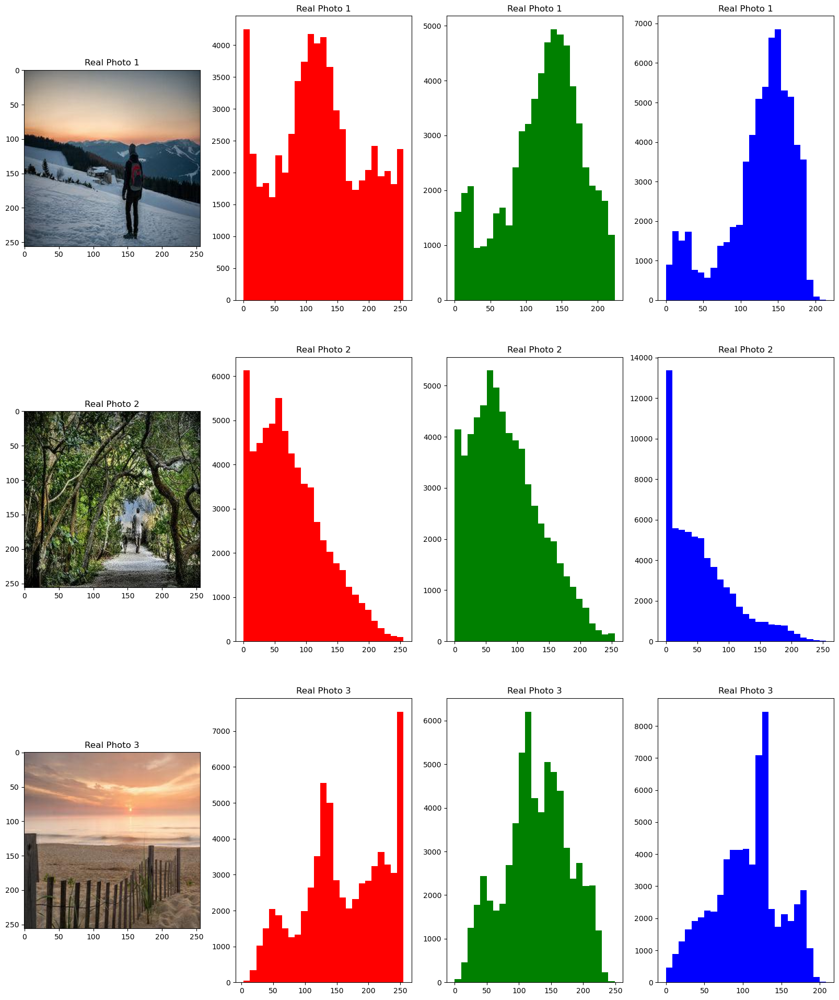

In [35]:
# Create subplots.
fig, ax = plt.subplots(num_pics, 4, figsize=(20, 4*2*num_pics))
for ind, val in enumerate(real_pics):

    # Read image.
    im = cv2.imread(os.path.join("photo_jpg", val))
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

    ax[ind][0].imshow(im)
    ax[ind][0].set_title(f'{("Real Photo " + str(ind + 1))}')

    # Plot histograms
    for ind2 in range(num_pics):
        image_inChanel = im[:,:,ind2].reshape(-1)
        ax[ind][ind2+1].hist(image_inChanel,bins=25, color=['r', 'g', 'b'][ind2])
        ax[ind][ind2+1].set_title(f'{("Real Photo " + str(ind + 1))}')

__Discussion__

In comparison, the histogram of Monet's paintings reveal a wide variance of colors and are not typically on the darker end of the spectrum. This highlight's Monet's use of color distributions and colorfulness in his artwork.

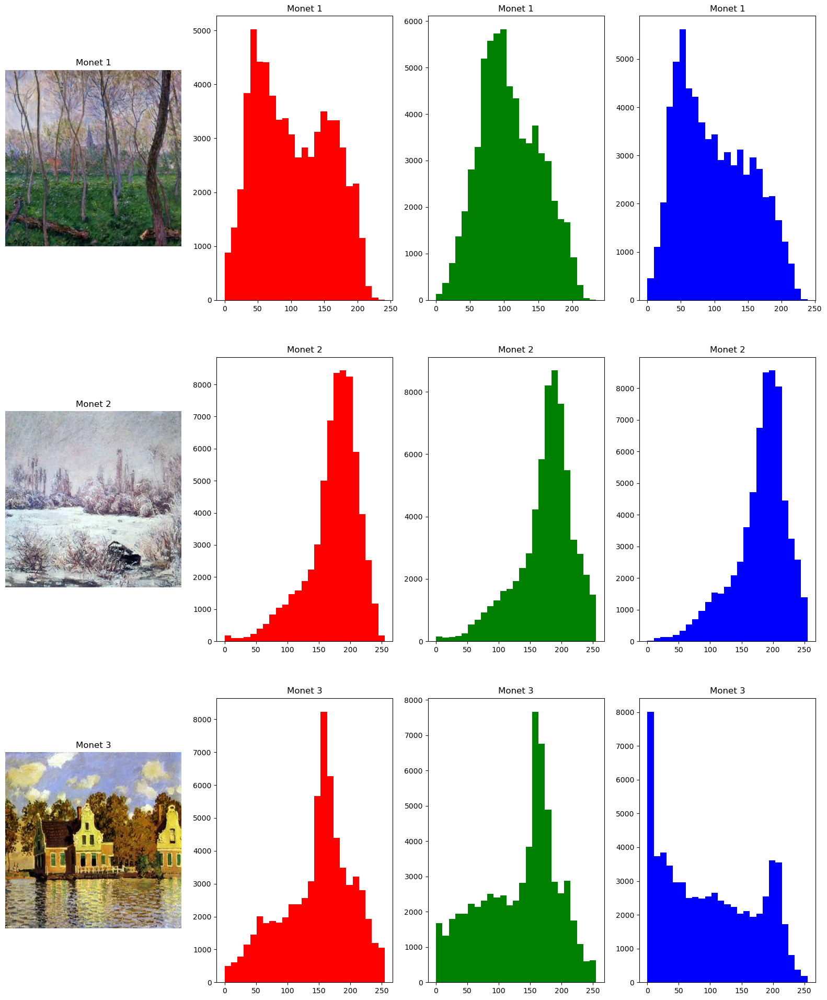

In [36]:
# Create subplots.
fig, ax = plt.subplots(num_pics, 4, figsize=(20, 4*2*num_pics))
for ind, val in enumerate(monet_pics):

    # Read image.
    im = cv2.imread(os.path.join("monet_jpg", val))
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB )

    ax[ind][0].imshow(im)
    ax[ind][0].axis('off')
    ax[ind][0].set_title(f'{("Monet " + str(ind + 1))}')

    # Plot histograms
    for ind2 in range(num_pics):
        image_inChanel = im[:,:,ind2].reshape(-1)
        ax[ind][ind2+1].hist(image_inChanel,bins=25, color=['r', 'g', 'b'][ind2])
        ax[ind][ind2+1].set_title(f'{("Monet " + str(ind + 1))}')

__Discussion__

Next, we will determine what is in TF records.  We find that each record contains a name, image, and target.

In [37]:
# Explore the tfrecords.

# Get example tf record.
tfExampleDataset = tf.data.TFRecordDataset(['monet_tfrec/monet00-60.tfrec'])
tfExampleRecord = next(iter(tfExampleDataset))
tfExampleTfr = tf.train.Example.FromString(tfExampleRecord.numpy())

# Create dictionary mapping tf record example features to tf record example keys.
vals = {key: tfExampleTfr.features.feature[key] for key in tfExampleTfr.features.feature.keys()}

# Output dictionary.  We see we have an image name, the image itself, and a target label. (monet since we sampled from monet_tfrec)
for key, val in vals.items():
    print("\nName: ", key)
    if key == 'image':
        print("Image bytes: ", val.bytes_list.value[0][:30])
    else:
        print("Target label: ", val)


Name:  image_name
Target label:  bytes_list {
  value: "25c9904782"
}


Name:  image
Image bytes:  b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x01,\x01,\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01'

Name:  target
Target label:  bytes_list {
  value: "monet"
}



# __Part 2: Cyclic GAN Training__

We will now create several Cyclic GAN models to give real world pictures Monet-like characteristics.  The CycleGAN class from tensorflow was used to create an API for individual generator and discriminator models.  The CycleGAN class below is initialized with two generators and their respective discriminators.  The first generator is trained against its discriminator to take real world images to a specific latent space.  This latent space is shared with the second generator model.  The second generator model is then trained against its discriminator to take images in the shared latent space back to the real world image domain, but with Monet like features.  This is accomplished by training the first generator on only real world pictures and the second generator on real world pictures and Monet's paintings. 

Due to my lack of experience with cyclic GAN models, the CNN architecture for the generator and discriminator models was heavily leveraged from the following Kaggle notebook:

https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

The cyclic GAN class was directly lifted from tensorflow's website:

https://www.tensorflow.org/tutorials/generative/cyclegan

In [38]:
# https://www.tensorflow.org/tutorials/generative/cyclegan

class CycleGan(keras.Model):

    # Initialize with two generators, two discriminators, and standard lambda cycle and identity values from tensorflow example.
    def __init__(self,generator_F,generator_G,discriminator_X,discriminator_Y,lambda_cycle=10.0,lambda_identity=0.5):
        super().__init__()
        self.gen_F = generator_F # Monet
        self.gen_G = generator_G # photo
        self.disc_X = discriminator_X # monet discriminator
        self.disc_Y = discriminator_Y # photo discriminator
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    # Compile function sets optimizeres and loss functions for cycle GAN model.
    def compile(self,gen_F_optimizer,gen_G_optimizer,disc_X_optimizer,disc_Y_optimizer,gen_loss_fn,disc_loss_fn):
        super().compile()
        self.gen_F_optimizer = gen_F_optimizer # Monet
        self.gen_G_optimizer = gen_G_optimizer # photo
        self.disc_X_optimizer = disc_X_optimizer # monet discriminator
        self.disc_Y_optimizer = disc_Y_optimizer # photo discriminator
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        
        real_x, real_y = batch_data

        with tf.GradientTape(persistent=True) as tape:

            # Generate fake pictures.
            fake_y = self.gen_G(real_x, training=True)
            fake_x = self.gen_F(real_y, training=True)

            # Cycle backwards each fake picture through the other generator.
            cycled_x = self.gen_F(fake_y, training=True)
            cycled_y = self.gen_G(fake_x, training=True)

            # Flip the real picture and generate the same fake pictures with the generators flipped.
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Run the discriminators against the real images.
            disc_real_x = self.disc_X(real_x, training=True)
            disc_real_y = self.disc_Y(real_y, training=True)

            # Run the discriminators against the fake images.
            disc_fake_x = self.disc_X(fake_x, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Compute generator losses.
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Compute cycled losses.
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "gen_photo_loss": total_loss_G,
            "gen_monet_loss": total_loss_F,
            "disc_monet_loss": disc_X_loss,
            "disc_photo_loss": disc_Y_loss,
        }

__Discussion__

Next we will instantiate some global variables.  First, the inputs shape is the size of the images, as shown above in the EDA.  Then we will develop a global variable for the number of features in a given convolutional layer within the GAN model.  Afterwards, we have several random initializers needed for the keras layers, an input layer, and a gaussian noise layer used to further randomize the training process.

In [39]:
# Input layer.
inputs = layers.Input(shape=[256,256,3])

# Initial convolutional layer sizes.
convSize = 16

# Random initializeres.
k_init = tf.random_normal_initializer(0., 0.2)
g_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.2)

# Input layer.
inp = layers.Input(shape=[256, 256, 3], name='input_image')

# Random noise layer.
noise = layers.GaussianNoise(0.01)(inp)

__Discussion__

Several helper functions are created.  The first is for parsing tf records for the training process.  The second two are loss functions for the cycle GAN models.  These are passed to the CycleGAN class and stored as loss functions used during the training process.  The discriminator loss function uses binary cross entropy for both the 'real' pictures and the 'monet-like' pictures.  The generator loss function function also uses binary cross entropy.  This was recommended on the tensorflow website.

In [40]:
def parse_rec(rec): 

    channels = 3
    size = 256
    half = (size - 1)/2
    
    rec = tf.io.parse_single_example(rec, {'image_name': tf.io.FixedLenFeature([], tf.string),'image':tf.io.FixedLenFeature([], tf.string),
                                           'target':tf.io.FixedLenFeature([], tf.string)})
    
    return tf.reshape((tf.cast(tf.image.decode_jpeg(rec['image'], channels=channels), tf.float32) / half) - 1, [*[size,size], channels])

def disc_loss(real, gen):
    real_loss = BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

    gen_loss = BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(gen), gen)

    total_loss = 0.5 * (real_loss + gen_loss)

    return total_loss

def gen_loss(gen):
    return BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(gen), gen)

__Discussion__


We will now create the cyclic GAN model generators. The architecture is constructed with convlutional layers for feature extraction, group normalization to help stabilize the training process, and leaky relu activation functions to help prevent overfitting by providing additional randomocity.  The architecture is constructed like an hour glass, similar to the architecture of an autoencoder.  The generator models are ultimately responsible for passing images from one domain to the other.  The Monet Generator passes pictures from the shared latent space to the 'real' space, but embeds monet like features.  The real photo generator passes pictures from the 'real' space to the shared latent space.s.

In [41]:
# Monet Generator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

encoder = [
    keras.Sequential([layers.Conv2D(convSize, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()])
]
for ind in range(3):
    encoder += [keras.Sequential([layers.Conv2D(convSize*2*2, 2,strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.LeakyReLU()])]

decoder = []
for ind in range(2):
    decoder += [
        keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.Dropout(0),
                              layers.ReLU()])] 

decoder.extend([
    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),layers.ReLU()])])

last = layers.Conv2DTranspose(3, 2,strides=2,padding='same',kernel_initializer=k_init,activation='tanh')


x = inputs
skips = []
for down in encoder:
    x = down(x)
    skips.append(x)

skips = reversed(skips[:-1]) 

for up, skip in zip(decoder, skips):
    x = up(x)
    x = layers.Concatenate()([x, skip])

m_gen = keras.Model(inputs=inputs, outputs=last(x))

In [42]:
# Real photo generator.
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

encoder = [
    keras.Sequential([layers.Conv2D(convSize, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()])
]
for ind in range(3):
    encoder += [keras.Sequential([layers.Conv2D(convSize*2*2, 2,strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.LeakyReLU()])]

decoder = []
for ind in range(2):
    decoder += [
        keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.Dropout(0),
                              layers.ReLU()])] 

decoder.extend([
    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),layers.ReLU()])])

last = layers.Conv2DTranspose(3, 2,strides=2,padding='same',kernel_initializer=k_init,activation='tanh')


x = inputs
skips = []
for down in encoder:
    x = down(x)
    skips.append(x)

skips = reversed(skips[:-1]) 

for up, skip in zip(decoder, skips):
    x = up(x)
    x = layers.Concatenate()([x, skip])

p_gen = keras.Model(inputs=inputs, outputs=last(x))

__Discussion__

We will now create the cyclic GAN model discriminators. The architecture is also constructed with convlutional layers for feature extraction, group normalization to help stabilize the training process, and leaky relu activation functions to help prevent overfitting by providing additional randomocity.  The discriminators are much smaller and have fewer parameters.

In [43]:
# Monet discriminator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

x = inp
x = layers.Concatenate()([x, noise])

down_layers = []

for i in range(2):
    filters = 32 * (2 ** i)
    if i==0:
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=1, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]))
    else:   
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]))

for down in down_layers:
    x = down(x)

conv = layers.Conv2D( 32 *  (2** (2)), 2, strides=1, kernel_initializer=k_init, use_bias=False)(layers.ZeroPadding2D()(x))
norm = tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=g_init)(conv)
last = layers.Conv2D(1, 2, strides=1, kernel_initializer=k_init)(layers.ZeroPadding2D()(layers.LeakyReLU()(norm)))

m_disc = tf.keras.Model(inputs=inp, outputs=last)

In [44]:
# Real photo discriminator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

x = inp
x = layers.Concatenate()([x, noise])

down_layers = []

for i in range(2):
    filters = 32 * (2 ** i)
    if i==0:
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=1, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]))
    else:   
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]))

for down in down_layers:
    x = down(x)

conv = layers.Conv2D( 32 *  (2** (2)), 2, strides=1, kernel_initializer=k_init, use_bias=False)(layers.ZeroPadding2D()(x))
norm = tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=g_init)(conv)
last = layers.Conv2D(1, 2, strides=1, kernel_initializer=k_init)(layers.ZeroPadding2D()(layers.LeakyReLU()(norm)))

p_disc =  tf.keras.Model(inputs=inp, outputs=last)

__Discussion__

Now we will check out the model summaries for each generator and discriminators.  We can see that the generators are much larger and ultimately downsample information from the 256 x 256 x 3 picture space to a 4 x 4 x 64 space, and then upsample back to 256 x 256 x 3.

In [51]:
m_gen.summary()
m_disc.summary()


Model: "functional_80"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_55      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_52       │ (None, 128, 128,  │        192 │ input_layer_55[0… │
│ (Sequential)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_53       │ (None, 64, 64,    │      2,112 │ sequential_52[0]… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_54       │ (None, 32, 32,    │      8,320 │ sequential_53[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_55       │ (None, 16, 16,    │     16,512 │ sequential_54[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_56       │ (None, 8, 8, 64)  │     16,512 │ sequential_55[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_57       │ (None, 4, 4, 64)  │     16,512 │ sequential_56[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_58       │ (None, 8, 8, 64)  │     16,512 │ sequential_57[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_24      │ (None, 8, 8, 128) │          0 │ sequential_58[0]… │
│ (Concatenate)       │                   │            │ sequential_56[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_59       │ (None, 16, 16,    │     32,896 │ concatenate_24[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_25      │ (None, 16, 16,    │          0 │ sequential_59[0]… │
│ (Concatenate)       │ 128)              │            │ sequential_55[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_60       │ (None, 32, 32,    │     32,896 │ concatenate_25[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_26      │ (None, 32, 32,    │          0 │ sequential_60[0]… │
│ (Concatenate)       │ 128)              │            │ sequential_54[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_61       │ (None, 64, 64,    │     32,896 │ concatenate_26[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_27      │ (None, 64, 64,    │          0 │ sequential_61[0]… │
│ (Concatenate)       │ 96)               │            │ sequential_53[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_62       │ (None, 128, 128,  │      6,176 │ concatenate_27[0… │
│ (Sequential)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_28      │ (None, 128, 128,  │          0 │ sequential_62[0]

 Total params: 181,923 (710.64 KB)

 Trainable params: 181,923 (710.64 KB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_97"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_3    │ (None, 256, 256,  │          0 │ input_image[0][0] │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_34      │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ gaussian_noise_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_74       │ (None, 256, 256,  │        768 │ concatenate_34[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_75       │ (None, 128, 128,  │      8,320 │ sequential_74[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_8    │ (None, 130, 130,  │          0 │ sequential_75[0]… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 129, 129,  │     32,768 │ zero_padding2d_8… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalizatio… │ (None, 129, 129,  │        256 │ conv2d_54[0][0]   │
│ (GroupNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_50      │ (None, 129, 129,  │          0 │ group_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_9    │ (None, 131, 131,  │          0 │ leaky_re_lu_50[0… │
│ (ZeroPadding2D)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 130, 130,  │        513 │ zero_padding2d_9… │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 42,625 (166.50 KB)

 Trainable params: 42,625 (166.50 KB)

 Non-trainable params: 0 (0.00 B)

In [52]:
p_gen.summary()
p_disc.summary()

Model: "functional_93"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_55      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_63       │ (None, 128, 128,  │        192 │ input_layer_55[0… │
│ (Sequential)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_64       │ (None, 64, 64,    │      2,112 │ sequential_63[0]… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_65       │ (None, 32, 32,    │      8,320 │ sequential_64[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_66       │ (None, 16, 16,    │     16,512 │ sequential_65[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_67       │ (None, 8, 8, 64)  │     16,512 │ sequential_66[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_68       │ (None, 4, 4, 64)  │     16,512 │ sequential_67[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_69       │ (None, 8, 8, 64)  │     16,512 │ sequential_68[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_29      │ (None, 8, 8, 128) │          0 │ sequential_69[0]… │
│ (Concatenate)       │                   │            │ sequential_67[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_70       │ (None, 16, 16,    │     32,896 │ concatenate_29[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_30      │ (None, 16, 16,    │          0 │ sequential_70[0]… │
│ (Concatenate)       │ 128)              │            │ sequential_66[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_71       │ (None, 32, 32,    │     32,896 │ concatenate_30[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_31      │ (None, 32, 32,    │          0 │ sequential_71[0]… │
│ (Concatenate)       │ 128)              │            │ sequential_65[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_72       │ (None, 64, 64,    │     32,896 │ concatenate_31[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_32      │ (None, 64, 64,    │          0 │ sequential_72[0]… │
│ (Concatenate)       │ 96)               │            │ sequential_64[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_73       │ (None, 128, 128,  │      6,176 │ concatenate_32[0… │
│ (Sequential)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_33      │ (None, 128, 128,  │          0 │ sequential_73[0]

 Total params: 181,923 (710.64 KB)

 Trainable params: 181,923 (710.64 KB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_101"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_3    │ (None, 256, 256,  │          0 │ input_image[0][0] │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_35      │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ gaussian_noise_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_76       │ (None, 256, 256,  │        768 │ concatenate_35[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_77       │ (None, 128, 128,  │      8,320 │ sequential_76[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_10   │ (None, 130, 130,  │          0 │ sequential_77[0]… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 129, 129,  │     32,768 │ zero_padding2d_1… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalizatio… │ (None, 129, 129,  │        256 │ conv2d_58[0][0]   │
│ (GroupNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_53      │ (None, 129, 129,  │          0 │ group_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_11   │ (None, 131, 131,  │          0 │ leaky_re_lu_53[0… │
│ (ZeroPadding2D)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 130, 130,  │        513 │ zero_padding2d_1… │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 42,625 (166.50 KB)

 Trainable params: 42,625 (166.50 KB)

 Non-trainable params: 0 (0.00 B)

__Discussion__

Next the GAN model is created using the generators and discriminators above.  The GAN model is compiled and trained on the training data set after some processing.

In [47]:
gan_model = CycleGan(m_gen, p_gen, m_disc, p_disc, lambda_cycle=10)

In [48]:
m_gen_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
p_gen_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
m_disc_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
p_disc_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)

gan_model.compile(m_gen_opt,p_gen_opt,m_disc_opt,p_disc_opt,gen_loss_fn = gen_loss,disc_loss_fn = disc_loss)

In [49]:
dataset = tf.data.TFRecordDataset(monet_tfrec)
dataset = dataset.map(parse_rec, num_parallel_calls=AUTO)
dataset = dataset.prefetch(AUTO)
monet_data = dataset.batch(batch_size=1)

dataset = tf.data.TFRecordDataset(real_tfrec)
dataset = dataset.map(parse_rec, num_parallel_calls=AUTO)
dataset = dataset.prefetch(AUTO)
photo_data = dataset.batch(batch_size=1)

In [50]:
hist_model1= gan_model.fit(tf.data.Dataset.zip((monet_data,photo_data)),epochs= 5,batch_size=10,verbose = 1)

Epoch 1/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 117s 286ms/step - disc_monet_loss: 0.6874 - disc_photo_loss: 0.6928 - gen_monet_loss: 2.5524 - gen_photo_loss: 2.8945 - loss: 0.0000e+00
Epoch 2/5


C:\Users\14436\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


300/300 ━━━━━━━━━━━━━━━━━━━━ 84s 281ms/step - disc_monet_loss: 0.6649 - disc_photo_loss: 0.6766 - gen_monet_loss: 2.0070 - gen_photo_loss: 2.2223 - loss: 0.0000e+00
Epoch 3/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 86s 286ms/step - disc_monet_loss: 0.6475 - disc_photo_loss: 0.6623 - gen_monet_loss: 1.9784 - gen_photo_loss: 2.1655 - loss: 0.0000e+00
Epoch 4/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 86s 285ms/step - disc_monet_loss: 0.6305 - disc_photo_loss: 0.6470 - gen_monet_loss: 2.0309 - gen_photo_loss: 2.2076 - loss: 0.0000e+00
Epoch 5/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 87s 290ms/step - disc_monet_loss: 0.6166 - disc_photo_loss: 0.6335 - gen_monet_loss: 2.0819 - gen_photo_loss: 2.2418 - loss: 0.0000e+00


__Discussion__

We can observe the __training loss curves__ evolving in a typical manner.  As more epochs are applied, the model overfits and loss begins to creep upwards.  Eventually I took __3 epochs__ to be appropriate as it seemed to produce the best combination of high validation and high training accuracy. (Note that the values below may differ than the values above because the training process is stochastic and I may have rerun it).

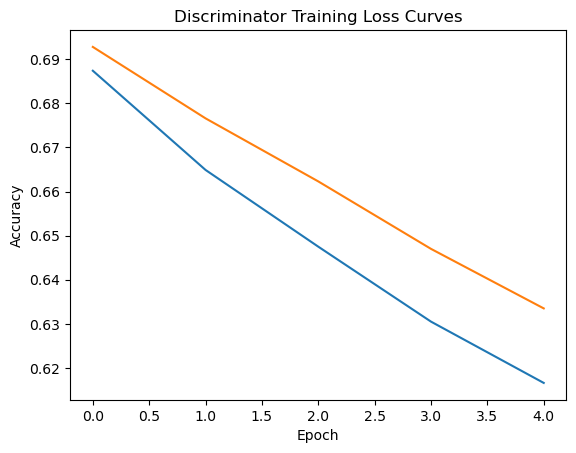

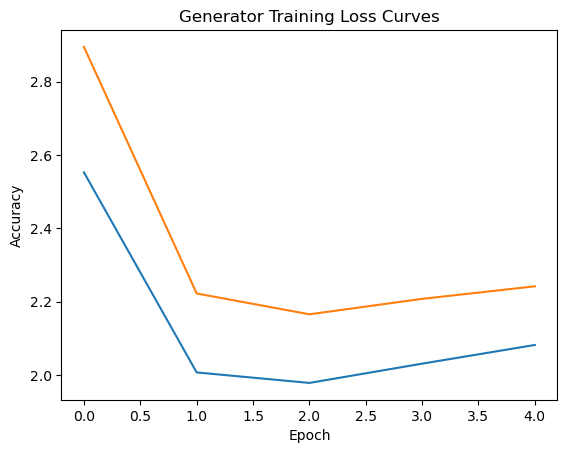

In [62]:
x = range(5)
y1 = [0.6874, 0.6649, 0.6475, 0.6305, 0.6166]
y2 = [0.6928 , 0.6766, 0.6623, 0.6470, 0.6335]
y3 = [2.5524 , 2.0070, 1.9784, 2.0309, 2.0819]
y4 = [2.8945 , 2.2223, 2.1655, 2.2076, 2.2418]

plt.plot(x,y1,y2)
plt.title("Discriminator Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

plt.plot(x,y3,y4)
plt.title("Generator Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

__Discussion__

After training, two photos are chosen at random to be moneticized. It did ok, better than I was expecting.  Noteably, the trees on the right are more smudged and the image looks a bit more surreal.  The leaves and grass are also more smudged, but the image still contains a lot of features and sharp defined contrasts, which aren't really characteristics of Monet.

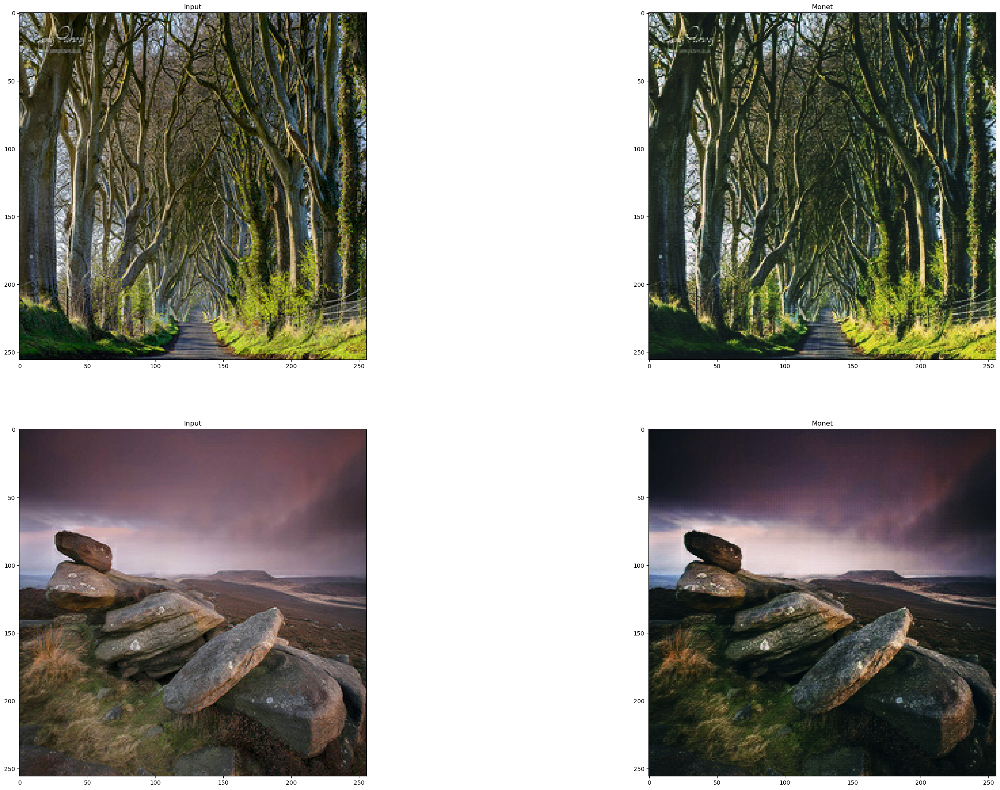

In [53]:
fig, ax = plt.subplots(2, 2, figsize=(36, 24))
half = (256 - 1)/2

for i, idx in enumerate(random.sample(range(len(list(photo_data))), 2)):
    pic = next(iter(photo_data.skip(idx).take(1)))
    latent_space = gan_model.gen_G(pic, training=False)
    prediction = gan_model.gen_F(latent_space,training=False)
    
    ax[i, 0].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(pic)))
    ax[i, 1].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(prediction)))
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Monet")

__Discussion__

We will now toggle the convolutional layer size in order to capture hyper parameter tuning.  We will go from convolutional layers of size 16 to 32.  This will greatly expand the size of our model and enhance its ability to capture refined features.  Maybe increasing the complexity of the algorithm will improve its ability to mimic Monet.  The process of creating the new cyclic GAN model is the same as before.  First new generators are created, then discriminators.  We will then take a look at the model summaries to observe the increased number of parameters, build and train the model.

In [64]:
convSize = 32

In [65]:
# Monet Generator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

encoder = [
    keras.Sequential([layers.Conv2D(convSize, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()])
]
for ind in range(3):
    encoder += [keras.Sequential([layers.Conv2D(convSize*2*2, 2,strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.LeakyReLU()])]

decoder = []
for ind in range(2):
    decoder += [
        keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.Dropout(0),
                              layers.ReLU()])] 

decoder.extend([
    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),layers.ReLU()])])

last = layers.Conv2DTranspose(3, 2,strides=2,padding='same',kernel_initializer=k_init,activation='tanh')


x = inputs
skips = []
for down in encoder:
    x = down(x)
    skips.append(x)

skips = reversed(skips[:-1]) 

for up, skip in zip(decoder, skips):
    x = up(x)
    x = layers.Concatenate()([x, skip])

m_gen = keras.Model(inputs=inputs, outputs=last(x))

In [66]:
# Real photo generator.
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

encoder = [
    keras.Sequential([layers.Conv2D(convSize, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()])
]
for ind in range(3):
    encoder += [keras.Sequential([layers.Conv2D(convSize*2*2, 2,strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.LeakyReLU()])]

decoder = []
for ind in range(2):
    decoder += [
        keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.Dropout(0),
                              layers.ReLU()])] 

decoder.extend([
    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),layers.ReLU()])])

last = layers.Conv2DTranspose(3, 2,strides=2,padding='same',kernel_initializer=k_init,activation='tanh')


x = inputs
skips = []
for down in encoder:
    x = down(x)
    skips.append(x)

skips = reversed(skips[:-1]) 

for up, skip in zip(decoder, skips):
    x = up(x)
    x = layers.Concatenate()([x, skip])

p_gen = keras.Model(inputs=inputs, outputs=last(x))

In [67]:
# Monet discriminator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

x = inp
x = layers.Concatenate()([x, noise])

down_layers = []

for i in range(2):
    filters = 32 * (2 ** i)
    if i==0:
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=1, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]))
    else:   
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]))

for down in down_layers:
    x = down(x)

conv = layers.Conv2D( 32 *  (2** (2)), 2, strides=1, kernel_initializer=k_init, use_bias=False)(layers.ZeroPadding2D()(x))
norm = tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=g_init)(conv)
last = layers.Conv2D(1, 2, strides=1, kernel_initializer=k_init)(layers.ZeroPadding2D()(layers.LeakyReLU()(norm)))

m_disc = tf.keras.Model(inputs=inp, outputs=last)

In [68]:
# Real photo discriminator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

x = inp
x = layers.Concatenate()([x, noise])

down_layers = []

for i in range(2):
    filters = 32 * (2 ** i)
    if i==0:
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=1, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]))
    else:   
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]))

for down in down_layers:
    x = down(x)

conv = layers.Conv2D( 32 *  (2** (2)), 2, strides=1, kernel_initializer=k_init, use_bias=False)(layers.ZeroPadding2D()(x))
norm = tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=g_init)(conv)
last = layers.Conv2D(1, 2, strides=1, kernel_initializer=k_init)(layers.ZeroPadding2D()(layers.LeakyReLU()(norm)))

p_disc =  tf.keras.Model(inputs=inp, outputs=last)

__Discussion__

Based on the model summaries below, we can now see that we have more than tripled the number of generator model parameters from 181k to 724k.

In [71]:
m_gen.summary()
m_disc.summary()

Model: "functional_114"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_55      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_78       │ (None, 128, 128,  │        384 │ input_layer_55[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_79       │ (None, 64, 64,    │      8,320 │ sequential_78[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_80       │ (None, 32, 32,    │     33,024 │ sequential_79[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_81       │ (None, 16, 16,    │     65,792 │ sequential_80[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_82       │ (None, 8, 8, 128) │     65,792 │ sequential_81[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_83       │ (None, 4, 4, 128) │     65,792 │ sequential_82[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_84       │ (None, 8, 8, 128) │     65,792 │ sequential_83[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_36      │ (None, 8, 8, 256) │          0 │ sequential_84[0]… │
│ (Concatenate)       │                   │            │ sequential_82[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_85       │ (None, 16, 16,    │    131,328 │ concatenate_36[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_37      │ (None, 16, 16,    │          0 │ sequential_85[0]… │
│ (Concatenate)       │ 256)              │            │ sequential_81[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_86       │ (None, 32, 32,    │    131,328 │ concatenate_37[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_38      │ (None, 32, 32,    │          0 │ sequential_86[0]… │
│ (Concatenate)       │ 256)              │            │ sequential_80[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_87       │ (None, 64, 64,    │    131,328 │ concatenate_38[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_39      │ (None, 64, 64,    │          0 │ sequential_87[0]… │
│ (Concatenate)       │ 192)              │            │ sequential_79[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_88       │ (None, 128, 128,  │     24,640 │ concatenate_39[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_40      │ (None, 128, 128,  │          0 │ sequential_88[0]

 Total params: 724,291 (2.76 MB)

 Trainable params: 724,291 (2.76 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_131"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_3    │ (None, 256, 256,  │          0 │ input_image[0][0] │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_46      │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ gaussian_noise_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_100      │ (None, 256, 256,  │        768 │ concatenate_46[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_101      │ (None, 128, 128,  │      8,320 │ sequential_100[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_12   │ (None, 130, 130,  │          0 │ sequential_101[0… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_74 (Conv2D)  │ (None, 129, 129,  │     32,768 │ zero_padding2d_1… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalizatio… │ (None, 129, 129,  │        256 │ conv2d_74[0][0]   │
│ (GroupNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_68      │ (None, 129, 129,  │          0 │ group_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_13   │ (None, 131, 131,  │          0 │ leaky_re_lu_68[0… │
│ (ZeroPadding2D)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_75 (Conv2D)  │ (None, 130, 130,  │        513 │ zero_padding2d_1… │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 42,625 (166.50 KB)

 Trainable params: 42,625 (166.50 KB)

 Non-trainable params: 0 (0.00 B)

In [72]:
p_gen.summary()
p_disc.summary()

Model: "functional_127"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_55      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_89       │ (None, 128, 128,  │        384 │ input_layer_55[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_90       │ (None, 64, 64,    │      8,320 │ sequential_89[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_91       │ (None, 32, 32,    │     33,024 │ sequential_90[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_92       │ (None, 16, 16,    │     65,792 │ sequential_91[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_93       │ (None, 8, 8, 128) │     65,792 │ sequential_92[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_94       │ (None, 4, 4, 128) │     65,792 │ sequential_93[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_95       │ (None, 8, 8, 128) │     65,792 │ sequential_94[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_41      │ (None, 8, 8, 256) │          0 │ sequential_95[0]… │
│ (Concatenate)       │                   │            │ sequential_93[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_96       │ (None, 16, 16,    │    131,328 │ concatenate_41[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_42      │ (None, 16, 16,    │          0 │ sequential_96[0]… │
│ (Concatenate)       │ 256)              │            │ sequential_92[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_97       │ (None, 32, 32,    │    131,328 │ concatenate_42[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_43      │ (None, 32, 32,    │          0 │ sequential_97[0]… │
│ (Concatenate)       │ 256)              │            │ sequential_91[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_98       │ (None, 64, 64,    │    131,328 │ concatenate_43[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_44      │ (None, 64, 64,    │          0 │ sequential_98[0]… │
│ (Concatenate)       │ 192)              │            │ sequential_90[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_99       │ (None, 128, 128,  │     24,640 │ concatenate_44[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_45      │ (None, 128, 128,  │          0 │ sequential_99[0]

 Total params: 724,291 (2.76 MB)

 Trainable params: 724,291 (2.76 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_135"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_3    │ (None, 256, 256,  │          0 │ input_image[0][0] │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_47      │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ gaussian_noise_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_102      │ (None, 256, 256,  │        768 │ concatenate_47[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_103      │ (None, 128, 128,  │      8,320 │ sequential_102[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_14   │ (None, 130, 130,  │          0 │ sequential_103[0… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_78 (Conv2D)  │ (None, 129, 129,  │     32,768 │ zero_padding2d_1… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalizatio… │ (None, 129, 129,  │        256 │ conv2d_78[0][0]   │
│ (GroupNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_71      │ (None, 129, 129,  │          0 │ group_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_15   │ (None, 131, 131,  │          0 │ leaky_re_lu_71[0… │
│ (ZeroPadding2D)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_79 (Conv2D)  │ (None, 130, 130,  │        513 │ zero_padding2d_1… │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 42,625 (166.50 KB)

 Trainable params: 42,625 (166.50 KB)

 Non-trainable params: 0 (0.00 B)

__Discussion__

A completely new model is created and trained in order to store it for later potential use if we deem it superior to the others.

In [74]:
gan_model_2 = CycleGan(m_gen, p_gen, m_disc, p_disc, lambda_cycle=10)

In [75]:
m_gen_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
p_gen_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
m_disc_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
p_disc_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)

gan_model_2.compile(m_gen_opt,p_gen_opt,m_disc_opt,p_disc_opt,gen_loss_fn = gen_loss,disc_loss_fn = disc_loss)

In [76]:
dataset = tf.data.TFRecordDataset(monet_tfrec)
dataset = dataset.map(parse_rec, num_parallel_calls=AUTO)
dataset = dataset.prefetch(AUTO)
monet_data = dataset.batch(batch_size=1)

dataset = tf.data.TFRecordDataset(real_tfrec)
dataset = dataset.map(parse_rec, num_parallel_calls=AUTO)
dataset = dataset.prefetch(AUTO)
photo_data = dataset.batch(batch_size=1)

In [77]:
hist_model2= gan_model_2.fit(tf.data.Dataset.zip((monet_data,photo_data)),epochs= 5,batch_size=10,verbose = 1)

Epoch 1/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 143s 370ms/step - disc_monet_loss: 0.6894 - disc_photo_loss: 0.6913 - gen_monet_loss: 2.3837 - gen_photo_loss: 2.6858 - loss: 0.0000e+00
Epoch 2/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 107s 357ms/step - disc_monet_loss: 0.6704 - disc_photo_loss: 0.6781 - gen_monet_loss: 1.9421 - gen_photo_loss: 2.1548 - loss: 0.0000e+00
Epoch 3/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 107s 357ms/step - disc_monet_loss: 0.6549 - disc_photo_loss: 0.6660 - gen_monet_loss: 1.9464 - gen_photo_loss: 2.1529 - loss: 0.0000e+00
Epoch 4/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 106s 352ms/step - disc_monet_loss: 0.6391 - disc_photo_loss: 0.6521 - gen_monet_loss: 1.9806 - gen_photo_loss: 2.1697 - loss: 0.0000e+00
Epoch 5/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 108s 362ms/step - disc_monet_loss: 0.6261 - disc_photo_loss: 0.6431 - gen_monet_loss: 2.0332 - gen_photo_loss: 2.2116 - loss: 0.0000e+00


__Discussion__

We can observe the __training loss curves__ evolving in a typical manner.  As more epochs are applied, the model overfits and loss begins to creep upwards.  Eventually I took __3 epochs__ to be appropriate as it seemed to produce the best combination of high validation and high training accuracy. (Note that the values below may differ than the values above because the training process is stochastic and I may have rerun it).

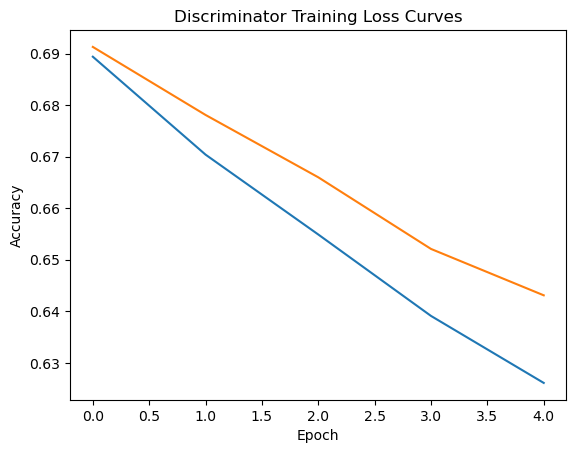

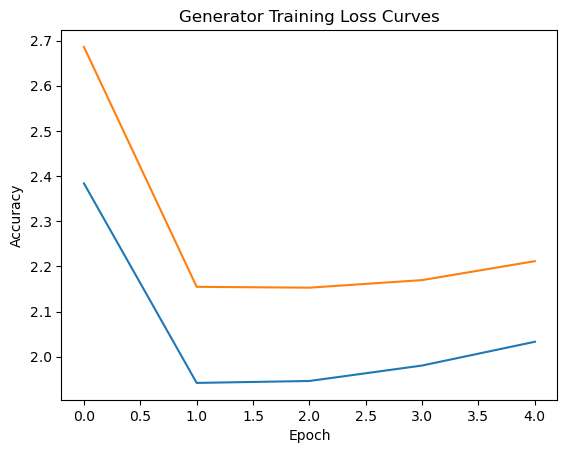

In [79]:
x = range(5)
y1 = [ 0.6894, 0.6704, 0.6549, 0.6391, 0.6261]
y2 = [0.6913, 0.6781, 0.6660, 0.6521, 0.6431]
y3 = [2.3837 , 1.9421, 1.9464, 1.9806, 2.0332]
y4 = [2.6858 , 2.1548,2.1529, 2.1697, 2.2116]

plt.plot(x,y1,y2)
plt.title("Discriminator Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

plt.plot(x,y3,y4)
plt.title("Generator Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

__Discussion__

After training, two photos are chosen at random to be moneticized. I personally believe it did worse.  It seems to be overfitting the real pictures.  I decided to go back and try another iteration of modifying the convolutional layer sizes to try to reduce the number of features its able to capture.  I didn't think going from 16 to 32 actually improved the situation.  Its performance basically remained the same.

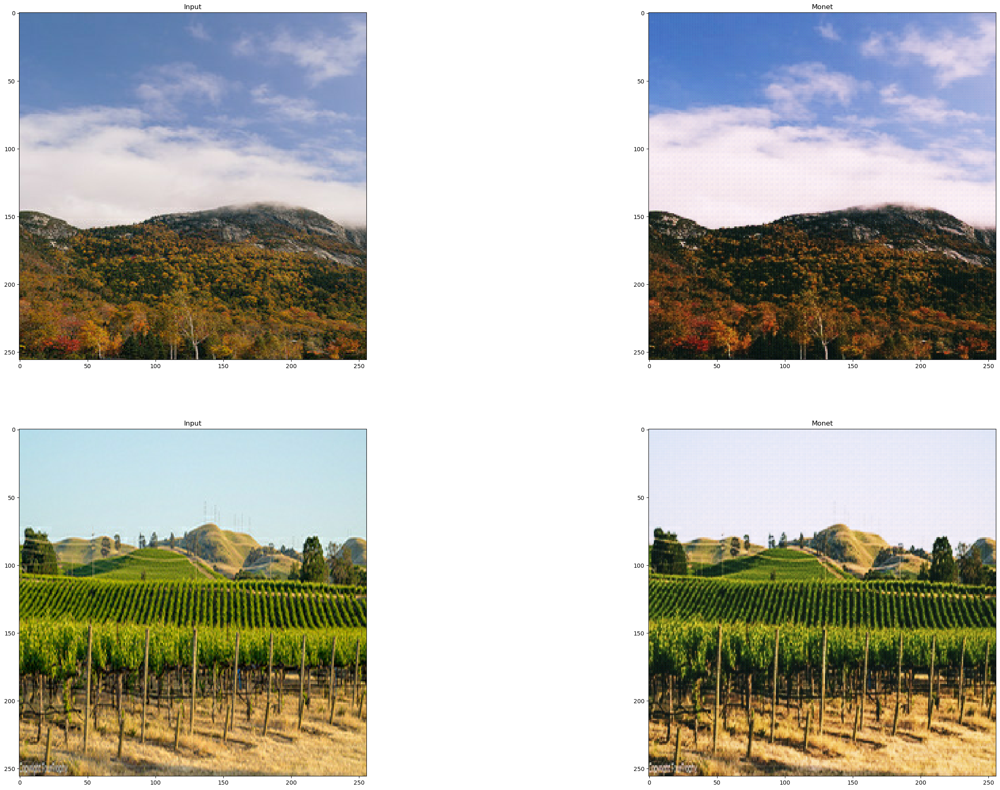

In [110]:
fig, ax = plt.subplots(2, 2, figsize=(36, 24))
half = (256 - 1)/2

for i, idx in enumerate(random.sample(range(len(list(photo_data))), 2)):
    pic = next(iter(photo_data.skip(idx).take(1)))
    latent_space = gan_model_2.gen_G(pic, training=False)
    prediction = gan_model_2.gen_F(latent_space,training=False)
    
    ax[i, 0].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(pic)))
    ax[i, 1].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(prediction)))
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Monet")

__Discussion__

We will now toggle the convolutional layer size in order to capture hyper parameter tuning.  We will go from convolutional layers of size 32 back down to 8. This will make it increasingly difficult for the generators to capture features, hopefully reducing the overfitting problem observed in the previous two models.

In [85]:
convSize = 8

In [86]:
# Monet Generator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

encoder = [
    keras.Sequential([layers.Conv2D(convSize, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()])
]
for ind in range(3):
    encoder += [keras.Sequential([layers.Conv2D(convSize*2*2, 2,strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.LeakyReLU()])]

decoder = []
for ind in range(2):
    decoder += [
        keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.Dropout(0),
                              layers.ReLU()])] 

decoder.extend([
    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),layers.ReLU()])])

last = layers.Conv2DTranspose(3, 2,strides=2,padding='same',kernel_initializer=k_init,activation='tanh')


x = inputs
skips = []
for down in encoder:
    x = down(x)
    skips.append(x)

skips = reversed(skips[:-1]) 

for up, skip in zip(decoder, skips):
    x = up(x)
    x = layers.Concatenate()([x, skip])

m_gen = keras.Model(inputs=inputs, outputs=last(x))

In [87]:
# Real photo generator.
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

encoder = [
    keras.Sequential([layers.Conv2D(convSize, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]),
    keras.Sequential([layers.Conv2D(convSize*2*2, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()])
]
for ind in range(3):
    encoder += [keras.Sequential([layers.Conv2D(convSize*2*2, 2,strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.LeakyReLU()])]

decoder = []
for ind in range(2):
    decoder += [
        keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                              tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                              layers.Dropout(0),
                              layers.ReLU()])] 

decoder.extend([
    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize*2*2, 2, strides=2,padding='same',
                                             kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.ReLU()]),

    keras.Sequential([layers.Conv2DTranspose(convSize, 2, strides=2,padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),layers.ReLU()])])

last = layers.Conv2DTranspose(3, 2,strides=2,padding='same',kernel_initializer=k_init,activation='tanh')


x = inputs
skips = []
for down in encoder:
    x = down(x)
    skips.append(x)

skips = reversed(skips[:-1]) 

for up, skip in zip(decoder, skips):
    x = up(x)
    x = layers.Concatenate()([x, skip])

p_gen = keras.Model(inputs=inputs, outputs=last(x))

In [88]:
# Monet discriminator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

x = inp
x = layers.Concatenate()([x, noise])

down_layers = []

for i in range(2):
    filters = 32 * (2 ** i)
    if i==0:
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=1, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]))
    else:   
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]))

for down in down_layers:
    x = down(x)

conv = layers.Conv2D( 32 *  (2** (2)), 2, strides=1, kernel_initializer=k_init, use_bias=False)(layers.ZeroPadding2D()(x))
norm = tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=g_init)(conv)
last = layers.Conv2D(1, 2, strides=1, kernel_initializer=k_init)(layers.ZeroPadding2D()(layers.LeakyReLU()(norm)))

m_disc = tf.keras.Model(inputs=inp, outputs=last)

In [89]:
# Real photo discriminator
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

x = inp
x = layers.Concatenate()([x, noise])

down_layers = []

for i in range(2):
    filters = 32 * (2 ** i)
    if i==0:
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=1, padding='same',kernel_initializer=k_init,use_bias=False),
                          layers.LeakyReLU()]))
    else:   
        down_layers.append(keras.Sequential([layers.Conv2D(filters, 2, strides=2, padding='same',kernel_initializer=k_init,use_bias=False),
                          tf.keras.layers.GroupNormalization(groups=-1,gamma_initializer=g_init),
                          layers.LeakyReLU()]))

for down in down_layers:
    x = down(x)

conv = layers.Conv2D( 32 *  (2** (2)), 2, strides=1, kernel_initializer=k_init, use_bias=False)(layers.ZeroPadding2D()(x))
norm = tf.keras.layers.GroupNormalization(groups=-1, gamma_initializer=g_init)(conv)
last = layers.Conv2D(1, 2, strides=1, kernel_initializer=k_init)(layers.ZeroPadding2D()(layers.LeakyReLU()(norm)))

p_disc =  tf.keras.Model(inputs=inp, outputs=last)

__Discussion__

Based on the model summaries below, we can now see that we have greatly reduced the number of parameters from 724k to only 45k.  Maybe this will help to prevent overfitting.

In [90]:
m_gen.summary()
m_disc.summary()

Model: "functional_148"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_55      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_104      │ (None, 128, 128,  │         96 │ input_layer_55[0… │
│ (Sequential)        │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_105      │ (None, 64, 64,    │        544 │ sequential_104[0… │
│ (Sequential)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_106      │ (None, 32, 32,    │      2,112 │ sequential_105[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_107      │ (None, 16, 16,    │      4,160 │ sequential_106[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_108      │ (None, 8, 8, 32)  │      4,160 │ sequential_107[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_109      │ (None, 4, 4, 32)  │      4,160 │ sequential_108[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_110      │ (None, 8, 8, 32)  │      4,160 │ sequential_109[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_48      │ (None, 8, 8, 64)  │          0 │ sequential_110[0… │
│ (Concatenate)       │                   │            │ sequential_108[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_111      │ (None, 16, 16,    │      8,256 │ concatenate_48[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_49      │ (None, 16, 16,    │          0 │ sequential_111[0… │
│ (Concatenate)       │ 64)               │            │ sequential_107[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_112      │ (None, 32, 32,    │      8,256 │ concatenate_49[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_50      │ (None, 32, 32,    │          0 │ sequential_112[0… │
│ (Concatenate)       │ 64)               │            │ sequential_106[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_113      │ (None, 64, 64,    │      8,256 │ concatenate_50[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_51      │ (None, 64, 64,    │          0 │ sequential_113[0… │
│ (Concatenate)       │ 48)               │            │ sequential_105[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_114      │ (None, 128, 128,  │      1,552 │ concatenate_51[0… │
│ (Sequential)        │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_52      │ (None, 128, 128,  │          0 │ sequential_114[0

 Total params: 45,907 (179.32 KB)

 Trainable params: 45,907 (179.32 KB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_165"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_3    │ (None, 256, 256,  │          0 │ input_image[0][0] │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_58      │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ gaussian_noise_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_126      │ (None, 256, 256,  │        768 │ concatenate_58[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_127      │ (None, 128, 128,  │      8,320 │ sequential_126[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_16   │ (None, 130, 130,  │          0 │ sequential_127[0… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_94 (Conv2D)  │ (None, 129, 129,  │     32,768 │ zero_padding2d_1… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalizatio… │ (None, 129, 129,  │        256 │ conv2d_94[0][0]   │
│ (GroupNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_86      │ (None, 129, 129,  │          0 │ group_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_17   │ (None, 131, 131,  │          0 │ leaky_re_lu_86[0… │
│ (ZeroPadding2D)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_95 (Conv2D)  │ (None, 130, 130,  │        513 │ zero_padding2d_1… │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 42,625 (166.50 KB)

 Trainable params: 42,625 (166.50 KB)

 Non-trainable params: 0 (0.00 B)

In [91]:
p_gen.summary()
p_disc.summary()

Model: "functional_161"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_55      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_115      │ (None, 128, 128,  │         96 │ input_layer_55[0… │
│ (Sequential)        │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_116      │ (None, 64, 64,    │        544 │ sequential_115[0… │
│ (Sequential)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_117      │ (None, 32, 32,    │      2,112 │ sequential_116[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_118      │ (None, 16, 16,    │      4,160 │ sequential_117[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_119      │ (None, 8, 8, 32)  │      4,160 │ sequential_118[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_120      │ (None, 4, 4, 32)  │      4,160 │ sequential_119[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_121      │ (None, 8, 8, 32)  │      4,160 │ sequential_120[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_53      │ (None, 8, 8, 64)  │          0 │ sequential_121[0… │
│ (Concatenate)       │                   │            │ sequential_119[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_122      │ (None, 16, 16,    │      8,256 │ concatenate_53[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_54      │ (None, 16, 16,    │          0 │ sequential_122[0… │
│ (Concatenate)       │ 64)               │            │ sequential_118[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_123      │ (None, 32, 32,    │      8,256 │ concatenate_54[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_55      │ (None, 32, 32,    │          0 │ sequential_123[0… │
│ (Concatenate)       │ 64)               │            │ sequential_117[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_124      │ (None, 64, 64,    │      8,256 │ concatenate_55[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_56      │ (None, 64, 64,    │          0 │ sequential_124[0… │
│ (Concatenate)       │ 48)               │            │ sequential_116[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_125      │ (None, 128, 128,  │      1,552 │ concatenate_56[0… │
│ (Sequential)        │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_57      │ (None, 128, 128,  │          0 │ sequential_125[0

 Total params: 45,907 (179.32 KB)

 Trainable params: 45,907 (179.32 KB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_169"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gaussian_noise_3    │ (None, 256, 256,  │          0 │ input_image[0][0] │
│ (GaussianNoise)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_59      │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ gaussian_noise_3… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_128      │ (None, 256, 256,  │        768 │ concatenate_59[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_129      │ (None, 128, 128,  │      8,320 │ sequential_128[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_18   │ (None, 130, 130,  │          0 │ sequential_129[0… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_98 (Conv2D)  │ (None, 129, 129,  │     32,768 │ zero_padding2d_1… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ group_normalizatio… │ (None, 129, 129,  │        256 │ conv2d_98[0][0]   │
│ (GroupNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_89      │ (None, 129, 129,  │          0 │ group_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_19   │ (None, 131, 131,  │          0 │ leaky_re_lu_89[0… │
│ (ZeroPadding2D)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_99 (Conv2D)  │ (None, 130, 130,  │        513 │ zero_padding2d_1… │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 42,625 (166.50 KB)

 Trainable params: 42,625 (166.50 KB)

 Non-trainable params: 0 (0.00 B)

__Discussion__

A completely new model is created and trained in order to store it for later potential use if we deem it superior to the others.

In [93]:
gan_model_3 = CycleGan(m_gen, p_gen, m_disc, p_disc, lambda_cycle=10)

In [94]:
m_gen_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
p_gen_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
m_disc_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)
p_disc_opt = tf.keras.optimizers.SGD(learning_rate=2e-6, momentum=0.5)

gan_model_3.compile(m_gen_opt,p_gen_opt,m_disc_opt,p_disc_opt,gen_loss_fn = gen_loss,disc_loss_fn = disc_loss)

In [95]:
dataset = tf.data.TFRecordDataset(monet_tfrec)
dataset = dataset.map(parse_rec, num_parallel_calls=AUTO)
dataset = dataset.prefetch(AUTO)
monet_data = dataset.batch(batch_size=1)

dataset = tf.data.TFRecordDataset(real_tfrec)
dataset = dataset.map(parse_rec, num_parallel_calls=AUTO)
dataset = dataset.prefetch(AUTO)
photo_data = dataset.batch(batch_size=1)

In [96]:
hist_model3= gan_model_3.fit(tf.data.Dataset.zip((monet_data,photo_data)),epochs= 5,batch_size=10,verbose = 1)

Epoch 1/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 109s 259ms/step - disc_monet_loss: 0.6838 - disc_photo_loss: 0.6926 - gen_monet_loss: 2.8242 - gen_photo_loss: 3.1296 - loss: 0.0000e+00
Epoch 2/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 81s 269ms/step - disc_monet_loss: 0.6563 - disc_photo_loss: 0.6737 - gen_monet_loss: 2.3207 - gen_photo_loss: 2.5169 - loss: 0.0000e+00
Epoch 3/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 78s 261ms/step - disc_monet_loss: 0.6378 - disc_photo_loss: 0.6579 - gen_monet_loss: 2.2124 - gen_photo_loss: 2.4128 - loss: 0.0000e+00
Epoch 4/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 76s 255ms/step - disc_monet_loss: 0.6241 - disc_photo_loss: 0.6403 - gen_monet_loss: 2.1582 - gen_photo_loss: 2.3286 - loss: 0.0000e+00
Epoch 5/5
300/300 ━━━━━━━━━━━━━━━━━━━━ 77s 255ms/step - disc_monet_loss: 0.6121 - disc_photo_loss: 0.6246 - gen_monet_loss: 2.2017 - gen_photo_loss: 2.3642 - loss: 0.0000e+00


__Discussion__

We can observe the __training loss curves__ evolving in a typical manner.  As more epochs are applied, the model overfits and loss begins to creep upwards.  Eventually I took __4 epochs__ to be appropriate as it seemed to produce the best combination of high validation and high training accuracy. (Note that the values below may differ than the values above because the training process is stochastic and I may have rerun it).

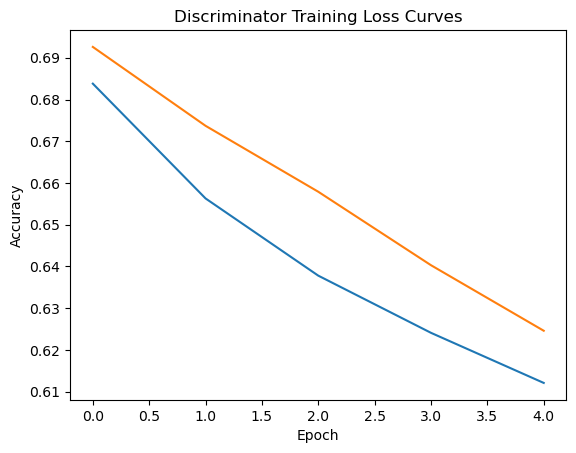

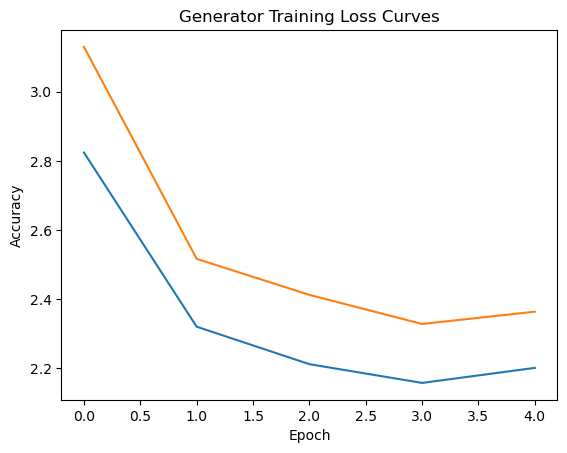

In [98]:
x = range(5)
y1 = [ 0.6838, 0.6563, 0.6378, 0.6241, 0.6121]
y2 = [0.6926, 0.6737, 0.6579, 0.6403, 0.6246]
y3 = [2.8242 , 2.3207, 2.2124, 2.1582, 2.2017]
y4 = [3.1296 , 2.5169,2.4128, 2.3286, 2.3642]

plt.plot(x,y1,y2)
plt.title("Discriminator Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

plt.plot(x,y3,y4)
plt.title("Generator Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

__Discussion__

Well, the new model certainly did not overfit the data too much.  However, its blurry nature still doesn't really resemble Monet's characteristics. Instead it just looks blurry.  I would actually say the first model with 16 convolutional layer sizes performed the best, ironically.

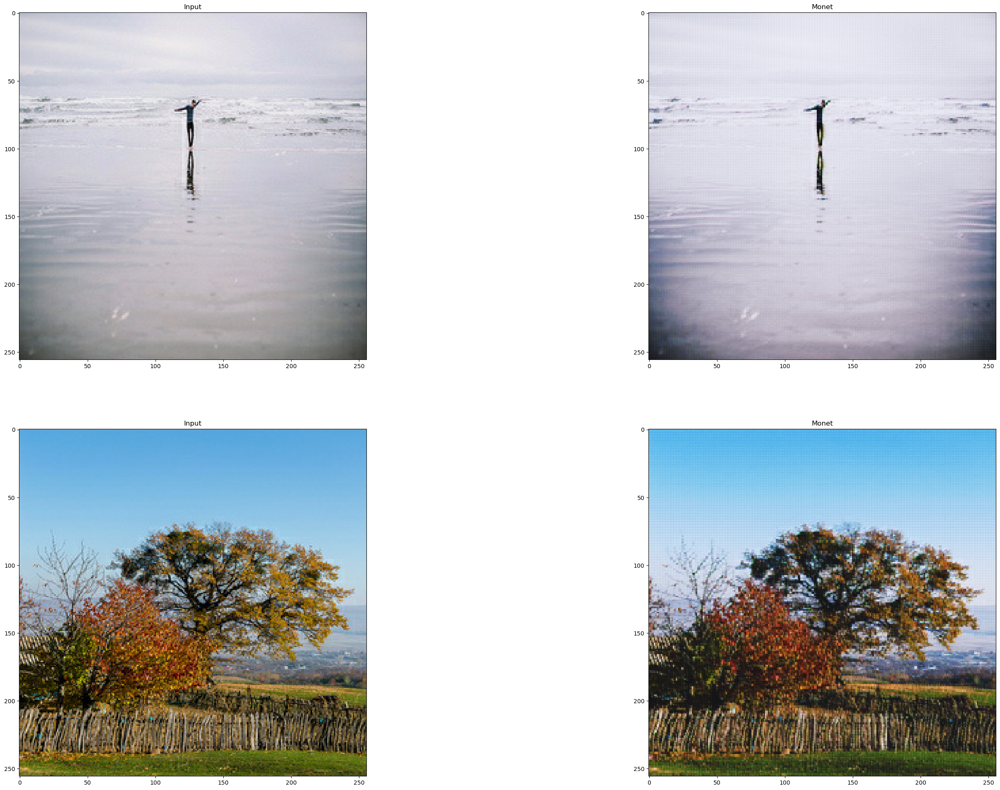

In [111]:
fig, ax = plt.subplots(2, 2, figsize=(36, 24))
half = (256 - 1)/2

for i, idx in enumerate(random.sample(range(len(list(photo_data))), 2)):
    pic = next(iter(photo_data.skip(idx).take(1)))
    latent_space = gan_model_3.gen_G(pic, training=False)
    prediction = gan_model_3.gen_F(latent_space,training=False)
    
    ax[i, 0].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(pic)))
    ax[i, 1].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(prediction)))
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Monet")

__Discussion__

We will try one last thing to try to alleviate the overfit problem.  We will produce an augmented data set and retrain the first model (conv layers size 16) off of this augmented data set. This augmented data set will take quite a while to churn through.  We will use 3 epochs, as that was what we found to work best previously with the first model.

Additionally, due to the enhanced amount of data, we will rely on a learning schedule to speed up training and hopefully also improve the fit.

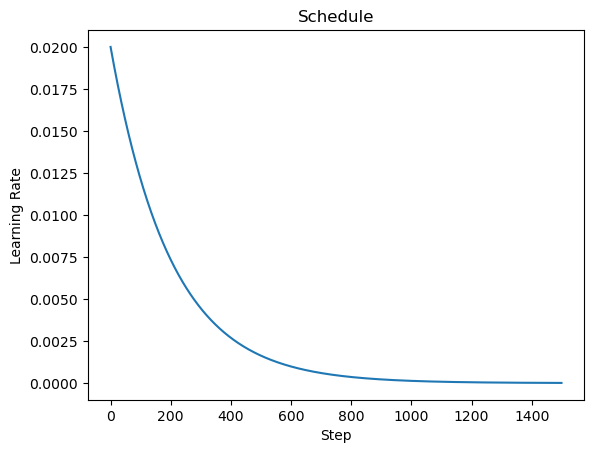

In [112]:
num_steps = int(300 / 1 * 5)
lr = []

for ind in range(num_steps):
    lr.append(0.02*(0.995**(ind)))

plt.plot(range(num_steps),lr)
plt.xlabel('Step')
plt.ylabel('Learning Rate')
plt.title('Schedule')

lr_schedule = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate = 0.02,decay_steps = num_steps,decay_rate = 0.995)

In [114]:
# Data augmentation helper functions.
# https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

def read_tfrecord(example): 
    tfrecord_format = {
        'image_name': tf.io.FixedLenFeature([], tf.string),
        'image':      tf.io.FixedLenFeature([], tf.string),
        'target':     tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*[256,256], 3]) 
    return image

def rot(image):
    try:
        rotation_angles = tf.constant([0, 1, 2, 3], dtype=tf.int32)
        shuffled_angles = tf.random.shuffle(rotation_angles)
        rotation_angle = shuffled_angles[0]
        image = tf.image.rot90(image, k=rotation_angle)
    except Exception as e:
        print("Error in image rotation:", e)
    return image

def image_flip(image):
    try:
        return tf.image.random_flip_left_right(tf.image.random_flip_up_down(image))
    except Exception as e:
        print("Error in image flip:", e)
        return image

def image_transpose(image):
    try:
        return tf.image.transpose(image)
    except Exception as e:
        print("Error in image transpose:", e)
        return image


def load_dataset(filenames, ordered=False,repeat=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTO)
    
    if repeat:
        dataset = dataset.repeat()
   
    dataset = dataset.shuffle(512)
    dataset = dataset.map(rot, num_parallel_calls=AUTO)
    dataset = dataset.map(image_transpose, num_parallel_calls=AUTO)
        
    dataset = dataset.prefetch(AUTO)

    return dataset

In [115]:
monet_data_4 = load_dataset(monet_tfrec, ordered=False,repeat=True).batch(batch_size=1)
photo_data_4 = load_dataset(real_tfrec,  ordered=False,repeat=False).batch(batch_size=1)

In [116]:
m_gen_opt_4 = tf.keras.optimizers.Adam(learning_rate=lr_schedule,  beta_1 =0.5 )
p_gen_opt_4 = tf.keras.optimizers.Adam(learning_rate=lr_schedule,beta_1 =0.5 )
m_disc_opt_4 = tf.keras.optimizers.Adam(learning_rate=lr_schedule,beta_1 =0.5 ) 
p_disc_opt_4 = tf.keras.optimizers.Adam(learning_rate=lr_schedule,beta_1 =0.5 )

In [117]:
hist_model_4= gan_model.fit(tf.data.Dataset.zip((monet_data_4,photo_data_4)),epochs= 3,batch_size=1,verbose = 1)

Epoch 1/3
7038/7038 ━━━━━━━━━━━━━━━━━━━━ 1932s 275ms/step - disc_monet_loss: 0.6343 - disc_photo_loss: 0.6229 - gen_monet_loss: 2.1514 - gen_photo_loss: 2.3508 - loss: 0.0000e+00
Epoch 2/3
7038/7038 ━━━━━━━━━━━━━━━━━━━━ 1944s 276ms/step - disc_monet_loss: 0.6300 - disc_photo_loss: 0.5789 - gen_monet_loss: 2.2068 - gen_photo_loss: 2.5531 - loss: 0.0000e+00
Epoch 3/3
7038/7038 ━━━━━━━━━━━━━━━━━━━━ 1929s 274ms/step - disc_monet_loss: 0.6303 - disc_photo_loss: 0.4037 - gen_monet_loss: 2.4844 - gen_photo_loss: 4.0288 - loss: 0.0000e+00


__Discussion__

We can observe the __training loss curves__ evolving in a typical manner.  As more epochs are applied, the model overfits and loss begins to creep upwards.  Eventually I took __4 epochs__ to be appropriate as it seemed to produce the best combination of high validation and high training accuracy. (Note that the values below may differ than the values above because the training process is stochastic and I may have rerun it).

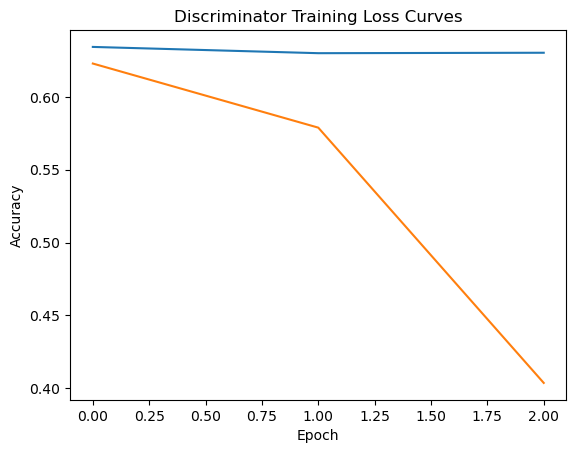

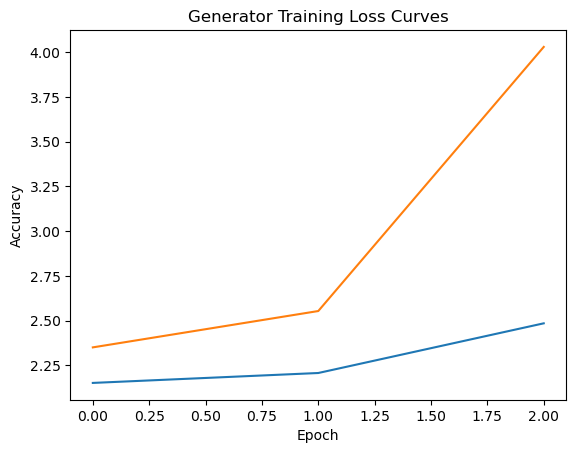

In [119]:
x = range(3)
y1 = [ 0.6343, 0.63, 0.6303]
y2 = [0.6229, 0.5789, 0.4037]
y3 = [2.1514, 2.2068, 2.4844]
y4 = [2.35, 2.5531, 4.0288]

plt.plot(x,y1,y2)
plt.title("Discriminator Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

plt.plot(x,y3,y4)
plt.title("Generator Training Loss Curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.show()

__Discussion__

We can observe that the pictures a bit more resemble Monet's style, but honestly it looks like it wasn't effected very much by the additional rotations and flips of data.  The overfit still appears to be present.

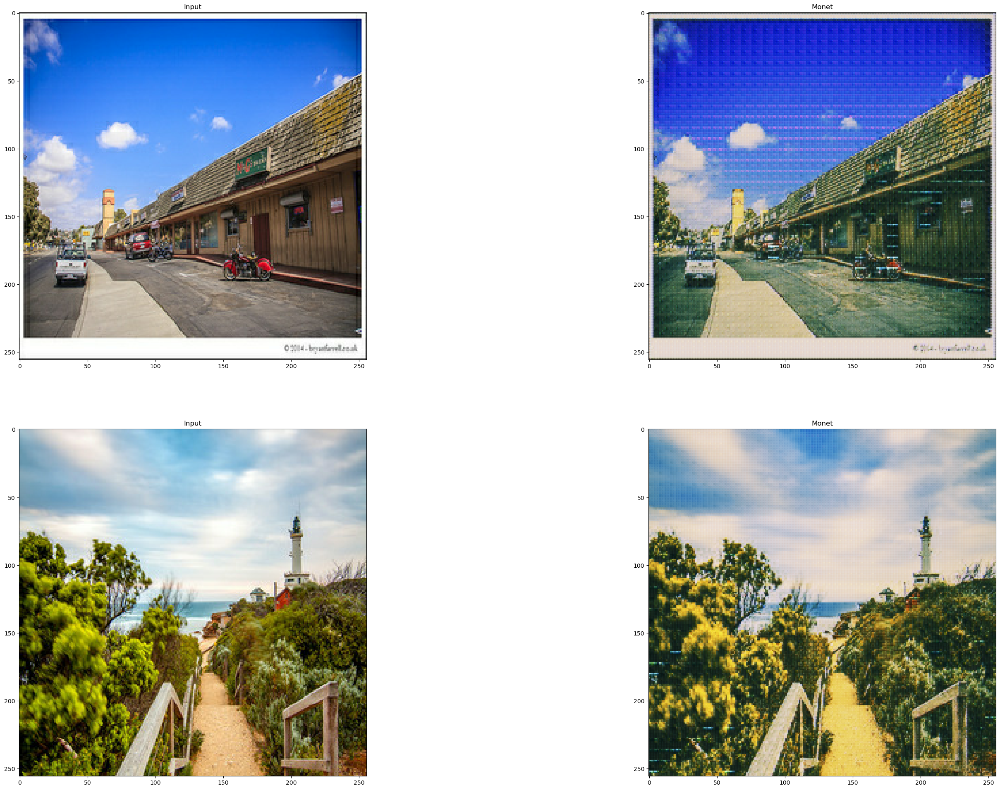

In [124]:
fig, ax = plt.subplots(2, 2, figsize=(36, 24))
half = (256 - 1)/2

for i, idx in enumerate(random.sample(range(len(list(photo_data))), 2)):
    pic = next(iter(photo_data.skip(idx).take(1)))
    latent_space = gan_model.gen_G(pic, training=False)
    prediction = gan_model.gen_F(latent_space,training=False)
    
    ax[i, 0].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(pic)))
    ax[i, 1].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(prediction)))
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Monet")

# __Part 3: Conclusion__

The Cyclic GAN models did not end up performing to expectations.  I was able to use DALL-E after this assignment to generate Monet-like pictures that, while they were not perfect, were better than the ones I produced in this assignment. Nevertheless, out of the four models I created to produce monet-like images, the first ended up performing the best.  

In retrospect, I think that I should have used InceptionNetV3, cut at a very low level, and transfer learning to produce the 'real photo' generator.  This would have enabled my first generator to produce a latent space with lines and curves.  Low level features that might have fed the monet generator with more effective boundaries than the real photo generator I created in this assignment.  I believe the real photo generator that I created was the culprit behind the overfit.  I believe this generator passed higher level objects and great amounts of detail to the latent space, which the monet generator then included in its output.

For completion's sake I have output the losses for each model below. Additionally, my Kaggle submission code is also shown below.

__Discussion__

Loss Performance bar plots.

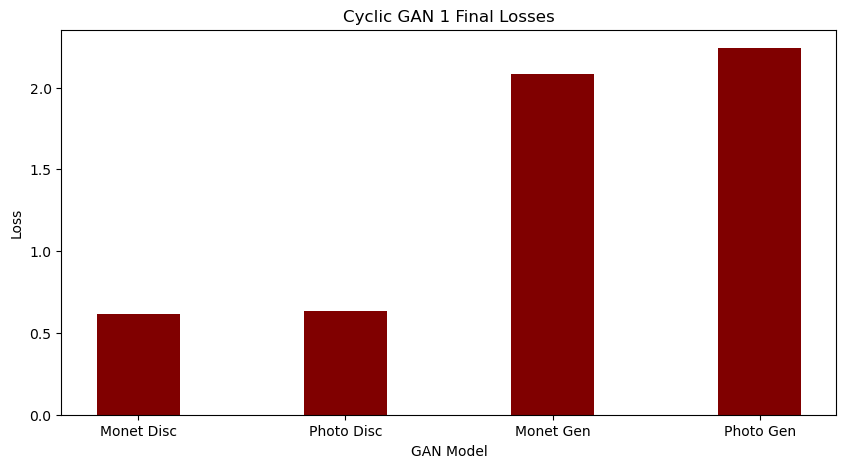

In [127]:
data = {'Monet Disc':0.6166, 'Photo Disc':0.6335, 'Monet Gen':2.0819, 'Photo Gen':2.2418}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (10, 5))

plt.bar(courses, values, color ='maroon', width = 0.4)
plt.xlabel("GAN Model")
plt.ylabel("Loss")
plt.title("Cyclic GAN 1 Final Losses")
plt.show()

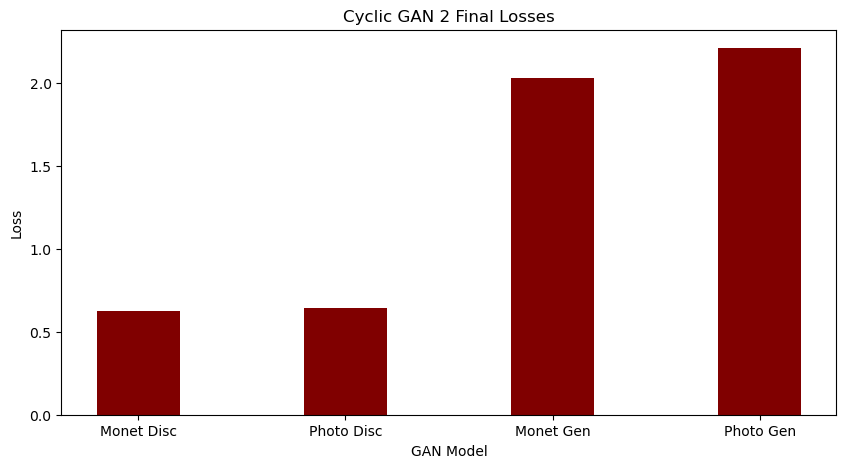

In [128]:
data = {'Monet Disc':0.6261, 'Photo Disc':0.6431, 'Monet Gen':2.0332, 'Photo Gen':2.2116}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (10, 5))

plt.bar(courses, values, color ='maroon', width = 0.4)
plt.xlabel("GAN Model")
plt.ylabel("Loss")
plt.title("Cyclic GAN 2 Final Losses")
plt.show()

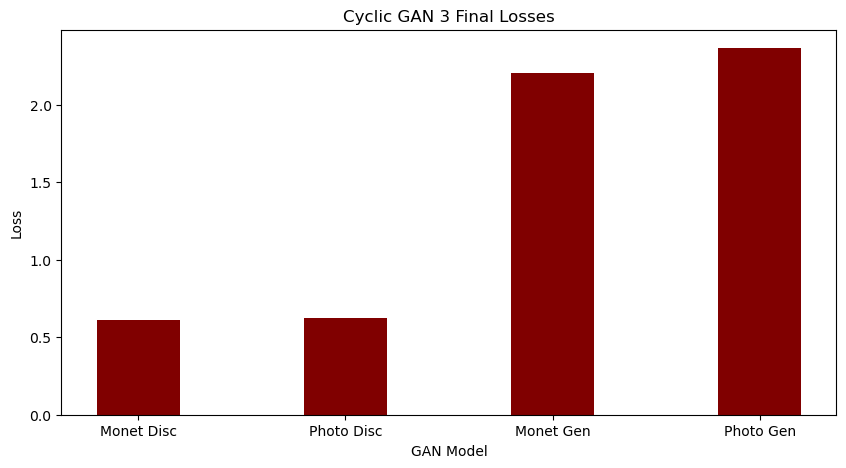

In [129]:
data = {'Monet Disc':0.6121, 'Photo Disc':0.6246, 'Monet Gen':2.2017, 'Photo Gen':2.3642}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (10, 5))

plt.bar(courses, values, color ='maroon', width = 0.4)
plt.xlabel("GAN Model")
plt.ylabel("Loss")
plt.title("Cyclic GAN 3 Final Losses")
plt.show()

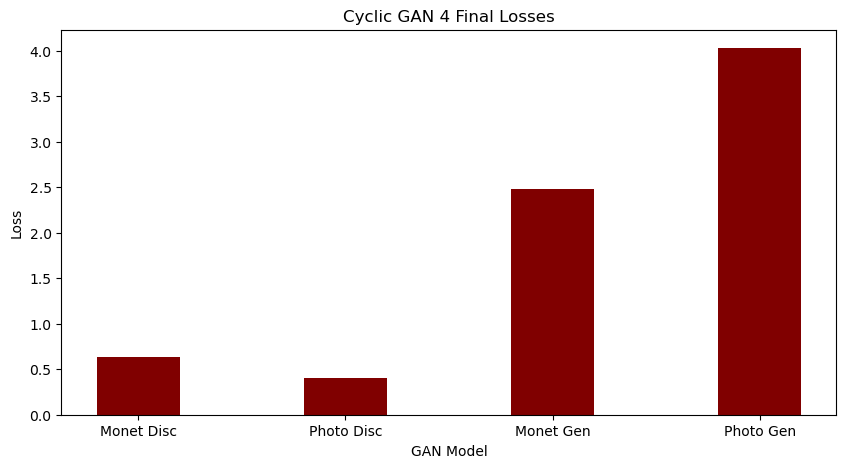

In [130]:
data = {'Monet Disc':0.6303, 'Photo Disc':0.4037, 'Monet Gen':2.4844, 'Photo Gen':4.0288}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (10, 5))

plt.bar(courses, values, color ='maroon', width = 0.4)
plt.xlabel("GAN Model")
plt.ylabel("Loss")
plt.title("Cyclic GAN 4 Final Losses")
plt.show()

__Discussion__

Let's check each model's monet loss generator as a possible benchmark for individual model success.  It appears that Model 2 achieved the lowest loss.

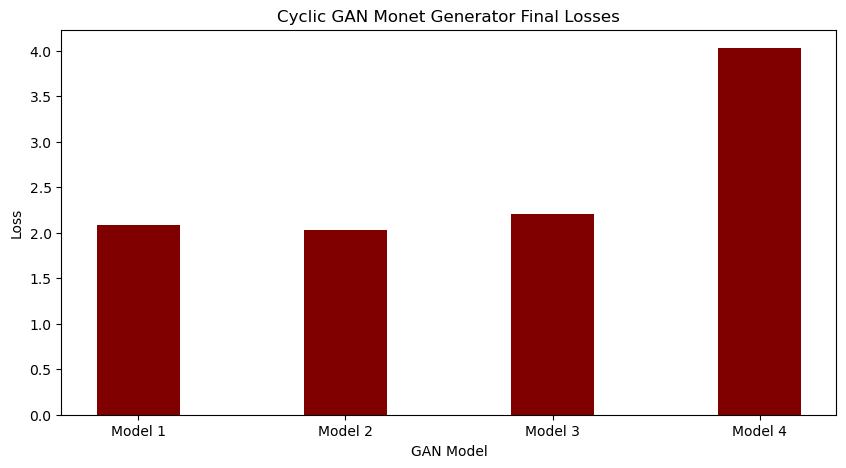

In [131]:
data = {'Model 1':2.0819, 'Model 2':2.0332, 'Model 3':2.2017, 'Model 4':4.0288}
courses = list(data.keys())
values = list(data.values())
  
fig = plt.figure(figsize = (10, 5))

plt.bar(courses, values, color ='maroon', width = 0.4)
plt.xlabel("GAN Model")
plt.ylabel("Loss")
plt.title("Cyclic GAN Monet Generator Final Losses")
plt.show()

__Discussion__

Model 2's output.

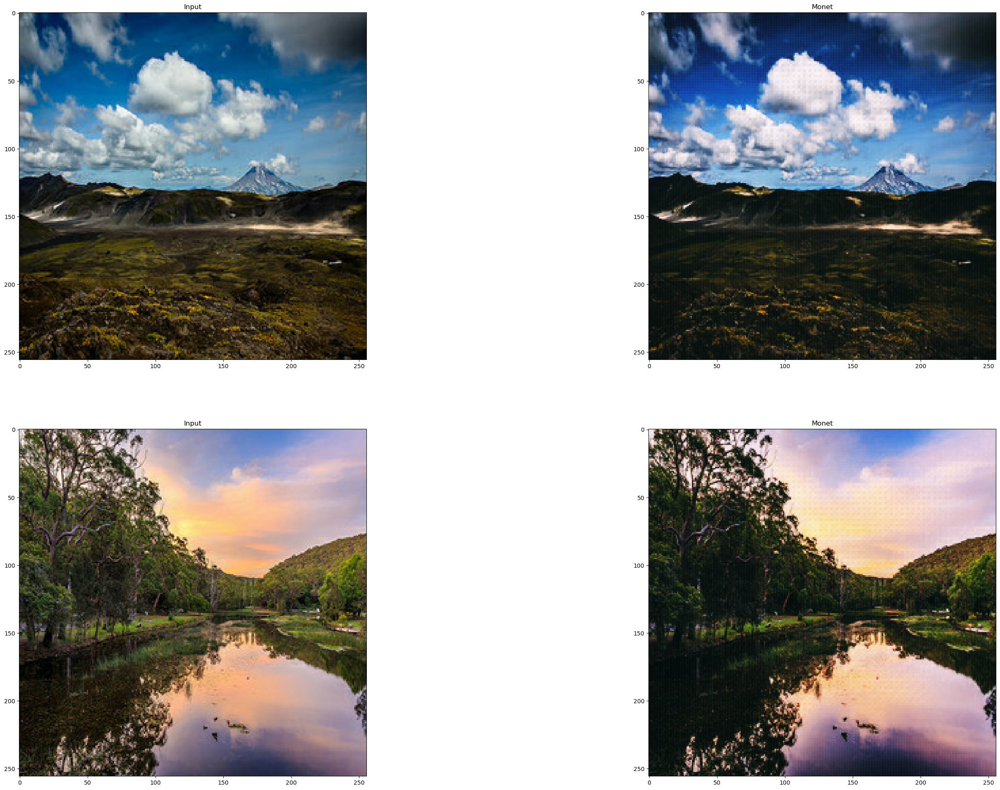

In [132]:
fig, ax = plt.subplots(2, 2, figsize=(36, 24))
half = (256 - 1)/2

for i, idx in enumerate(random.sample(range(len(list(photo_data))), 2)):
    pic = next(iter(photo_data.skip(idx).take(1)))
    latent_space = gan_model_2.gen_G(pic, training=False)
    prediction = gan_model_2.gen_F(latent_space,training=False)
    
    ax[i, 0].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(pic)))
    ax[i, 1].imshow(tf.keras.preprocessing.image.array_to_img(tf.squeeze(prediction)))
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Monet")

__Discussion__

Output for Kaggle across test data.

In [ ]:
! mkdir ../images
i = 1
for p in photo_data:
    monet = m_gen(p, training=False)[0].numpy()
    monet = (monet * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(monet)
    im.save("../images/" + str(i) + ".jpg")
    i += 1

__References__

1. JIESHENDS2020. kaggle. GAN painting - Part 2. https://www.kaggle.com/code/jieshends2020/gan-painting-part-2

2. tensorflow. CycleGAN. https://www.tensorflow.org/tutorials/generative/cyclegan